### 2D Seismic Images Input

In [267]:
from PIL import Image
import matplotlib.pyplot as plt
import os
import numpy as np
import cv2
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import array_to_img
%matplotlib inline

Text(0.5, 1.0, 'Inline 2900  - with interpretation')

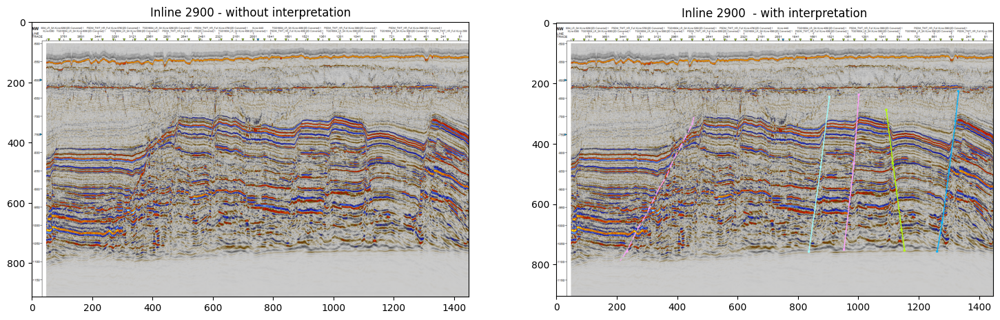

In [190]:
# Load the image from PIL library

image_dir = os.path.join('seismic_images/old/IL/', 'IL2900-')
image1 = Image.open(image_dir + 'without.png')
image2 = Image.open(image_dir + 'with.png')

# Convert the images in numpy format or opencv

np_frame1 = np.array(image1.getdata())
np_frame2 = np.array(image2.getdata())

# By using keras.preprocessing.image for conversion
img_numpy_array1 = img_to_array(image1)
img_numpy_array2 = img_to_array(image2)

# Display the images using Matplotlib
fig = plt.figure(figsize=(18,18))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(image1)
ax.set_title(f'Inline 2900 - without interpretation')

ax = fig.add_subplot(1, 2, 2)
plt.imshow(image2)
ax.set_title(f'Inline 2900  - with interpretation')

Text(0.5, 1.0, 'Labelled Image')

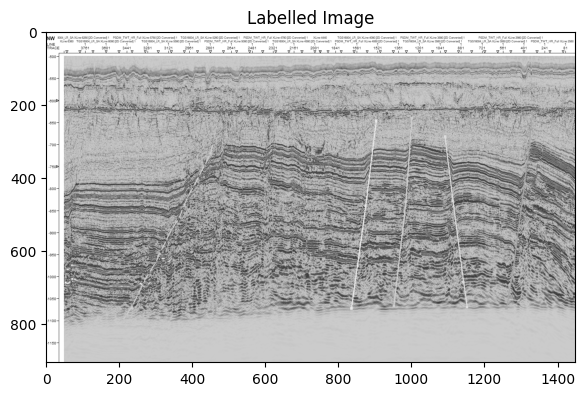

In [191]:
image_path = 'seismic_images/old/IL/IL2900-with.png'

# Opencv grayscale
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img,cmap='gray')
plt.title('Labelled Image')

In [192]:
print(img.shape)
img_numpy_array2.shape

(905, 1447)


(905, 1447, 4)

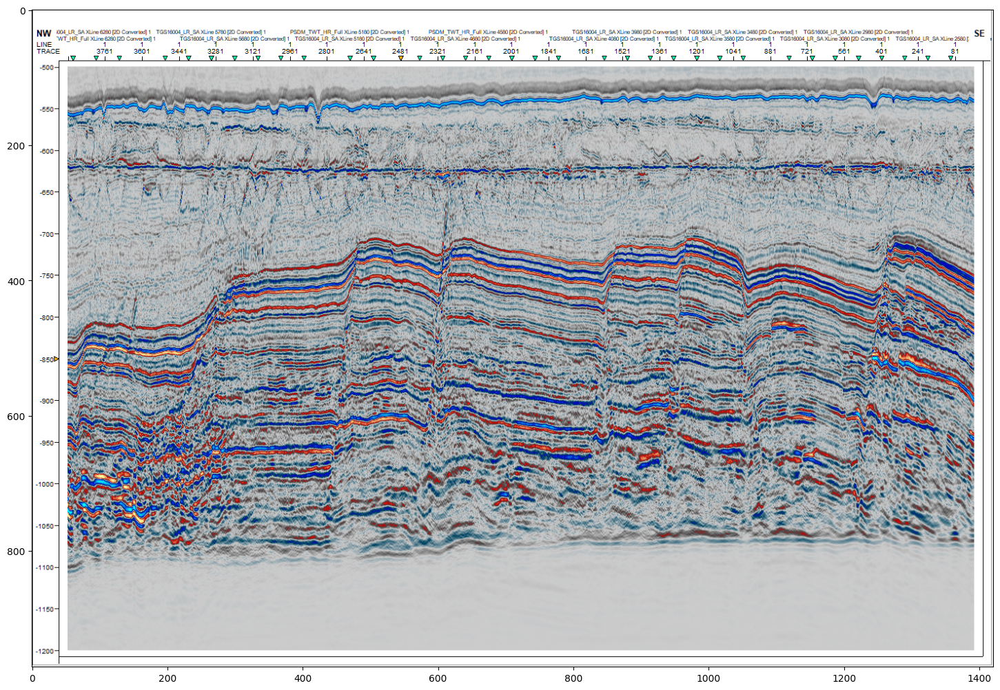

In [313]:
#img_path = os.path.join('seismic_images/images_IL_XL_labels/seismic', 'IL2800.png')
image_path = 'seismic_images/images_IL_XL_labels/seismic/IL2800.png'
seismic_image = cv2.imread(image_path, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(18,18))
plt.imshow(seismic_image)
plt.show()

--------
### 2D Seismic Profile - Segy Loading

In [194]:
import re
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import segyio

# Load segy file using segyio package

In [195]:
filename = 'seismic_images/segy/HR-IL2800.sgy'

In [196]:
def FileExists(file):
    if (os.path.isfile(file)):
        print('File exists')
    else:
        print('File does not exist or could not be found')
FileExists(filename)

File exists


In [197]:
# trace header and text header functions

def parse_trace_headers(segyfile, n_traces):
    '''
    Parse the segy file trace headers into a pandas dataframe.
    Column names are defined from segyio internal tracefield
    One row per trace
    '''
    # Get all header keys
    headers = segyio.tracefield.keys
    # Initialize dataframe with trace id as index and headers as columns
    df = pd.DataFrame(index=range(1, n_traces + 1),
                      columns=headers.keys())
    # Fill dataframe with all header values
    for k, v in headers.items():
        df[k] = segyfile.attributes(v)[:]
    return df


def parse_text_header(segyfile):
    '''
    Format segy text header into a readable, clean dict
    '''
    raw_header = segyio.tools.wrap(segyfile.text[0])
    # Cut on C*int pattern
    cut_header = re.split(r'C ', raw_header)[1::]
    # Remove end of line return
    text_header = [x.replace('\n', ' ') for x in cut_header]
    text_header[-1] = text_header[-1][:-2]
    # Format in dict
    clean_header = {}
    i = 1
    for item in text_header:
        key = "C" + str(i).rjust(2, '0')
        i += 1
        clean_header[key] = item
    return clean_header

In [198]:
with segyio.open(filename, ignore_geometry=True) as f:
    # Get basic attributes
    n_traces = f.tracecount
    sample_rate = segyio.tools.dt(f) / 1000
    n_samples = f.samples.size
    twt = f.samples
    data = f.trace.raw[:]  # Get all data into memory (could cause on big files)
    # Load headers - binary header, text header and trace header
    bin_headers = f.bin
    text_headers = parse_text_header(f)
    trace_headers = parse_trace_headers(f, n_traces)
f'N Traces: {n_traces}, N Samples: {n_samples}, Sample rate: {sample_rate}ms'

'N Traces: 3921, N Samples: 701, Sample rate: 1.0ms'

In [199]:
clip_percentile = 99
vm = np.percentile(data, clip_percentile)
f'The {clip_percentile}th percentile is {vm:.0f}; the max amplitude is {data.max():.0f}'

'The 99th percentile is 6; the max amplitude is 19'

Text(0.5, 1.0, 'HR-IL2800.SGY')

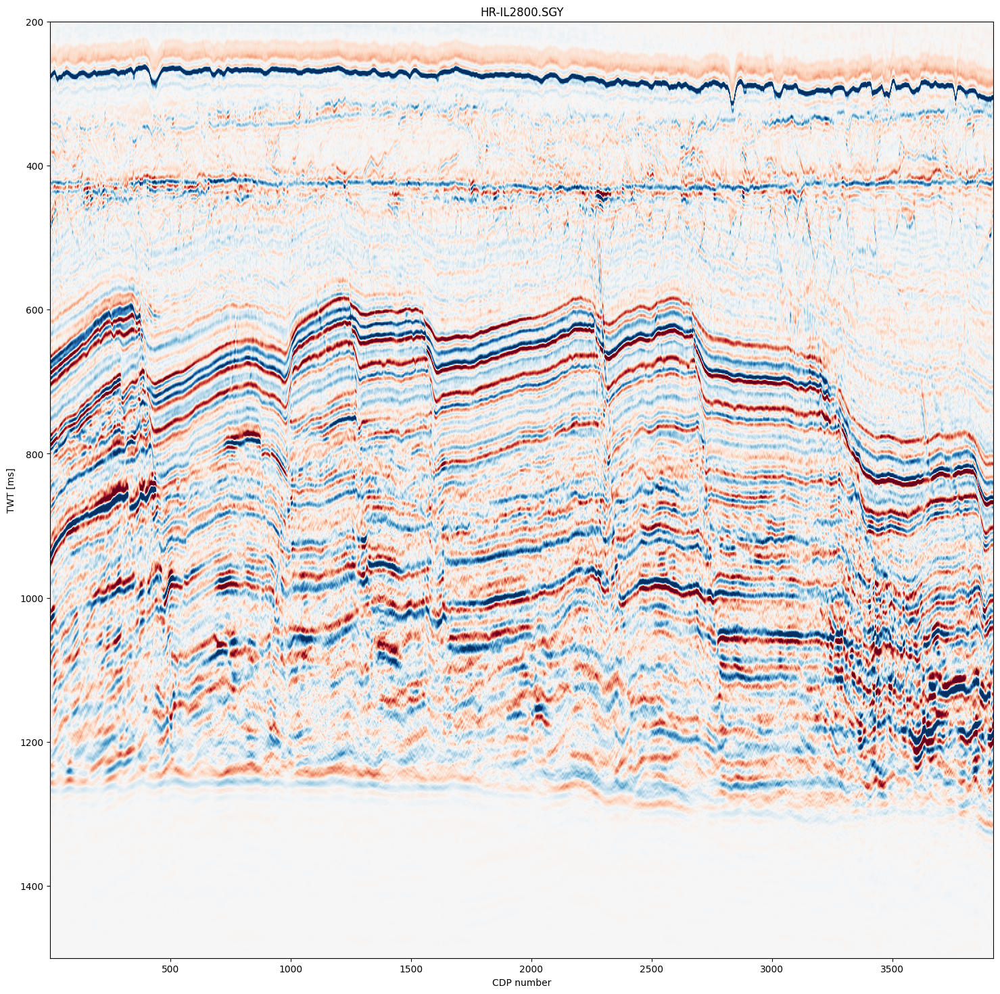

In [314]:
fig = plt.figure(figsize=(18, 18))
ax = fig.add_subplot(1, 1, 1)
extent = [1, n_traces, twt[-1], twt[0]]  # define extent
ax.imshow(data.T, cmap="RdBu", vmin=-vm, vmax=vm, aspect='auto', extent=extent)
# optional colormap "gray_r" or "RdBu"
ax.set_xlabel('CDP number')
ax.set_ylabel('TWT [ms]')
ax.set_title(f'HR-IL2800.SGY')

Load all the 2D lines and save them in a cube

In [339]:
def load_seismic(seismics_path): # read and store all file names in order
    for (_, _, filenames) in walk(seismics_path):
        segy = sorted(filenames)

    print("number of data files in the folder: ",len(segy))
    print("seismics_path: ", seismics_path)
    print(segy[:10])

    return seismics_path, segy

In [341]:
seis_path = 'seismic_images/sgy_data'
seismics_path,seismics = load_seismic(seis_path)

number of data files in the folder:  126
seismics_path:  seismic_images/sgy_data
['HR-IL2800.crsmeta.sgy', 'HR-IL2800.sgy', 'HR-IL2900.segy.crsmeta.sgy', 'HR-IL2900.sgy', 'HR-IL3000.segy.crsmeta.sgy', 'HR-IL3000.sgy', 'HR-IL3100.segy.crsmeta.sgy', 'HR-IL3100.sgy', 'HR-IL3200.segy.crsmeta.sgy', 'HR-IL3200.sgy']


In [265]:
data.shape

(3921, 701)

---------
### 3D Seismic Volumn - Segy Loading

In [208]:
local_file = 'f3-dsmf.sgy'
inlines,xlines,twt='','',''

with segyio.open(local_file,"r") as f:
    inlines,xlines,twt =f.ilines, f.xlines, f.samples

print("Inline range:", np.amin(inlines), "-", np.amax(inlines), ", count:", inlines.shape[0])
print("Xline range:", np.amin(xlines), "-", np.amax(xlines), ", count:", xlines.shape[0])
print("TWT range [ms]:", np.amin(twt), "-", np.amax(twt), ", count", twt.shape[0])

Inline range: 200 - 600 , count: 401
Xline range: 500 - 1100 , count: 601
TWT range [ms]: 200.0 - 1500.0 , count 326


In [209]:
# calculating steps by substracting adjacent elements
il_st = np.unique(inlines)[1]-np.unique(inlines)[0]
xl_st = np.unique(xlines)[1]-np.unique(xlines)[0]
twt_st = np.unique(twt)[1]-np.unique(twt)[0]
print("IL/XL and TWT[ms] step:", il_st, ",", xl_st, ",", twt_st) 

IL/XL and TWT[ms] step: 1 , 1 , 4.0


In [210]:
# read seismic data and print out 3D shape
seismic_data = segyio.tools.cube(local_file)
print("Survey IL/XL/TWT shape:", seismic_data.shape[0], "/", seismic_data.shape[1], "/", seismic_data.shape[2])

Survey IL/XL/TWT shape: 401 / 601 / 326


In [211]:
def set_position_label(interval,tick, step, start_value):
    positions = np.arange(0, interval, tick/step)
    labels = positions * step + start_value
    labels = labels.astype(int)
    return positions, labels

# step between tick labels for inlines, xlines and twt
il_tl = 100 
xl_tl = 100
twt_tl = 200

# Step between tick labels for inlines, xlines, and twt

il_pos, il_lab = set_position_label(seismic_data.shape[0], il_tl, il_st, inlines[0])
xl_pos, xl_lab = set_position_label(seismic_data.shape[1], xl_tl, xl_st, xlines[0])
twt_pos, twt_lab = set_position_label(seismic_data.shape[2], twt_tl,twt_st, twt[0] )

print(f"il ticks positions = {il_pos} and labels ={il_lab}",
      f"\nxl ticks positions = {xl_pos} and labels ={xl_lab}",
      f"\ntwt ticks positions = {twt_pos} and labels = {twt_lab}")

il ticks positions = [  0. 100. 200. 300. 400.] and labels =[200 300 400 500 600] 
xl ticks positions = [  0. 100. 200. 300. 400. 500. 600.] and labels =[ 500  600  700  800  900 1000 1100] 
twt ticks positions = [  0.  50. 100. 150. 200. 250. 300.] and labels = [ 200  400  600  800 1000 1200 1400]


Text(0.5, 1.0, 'Inline = 201')

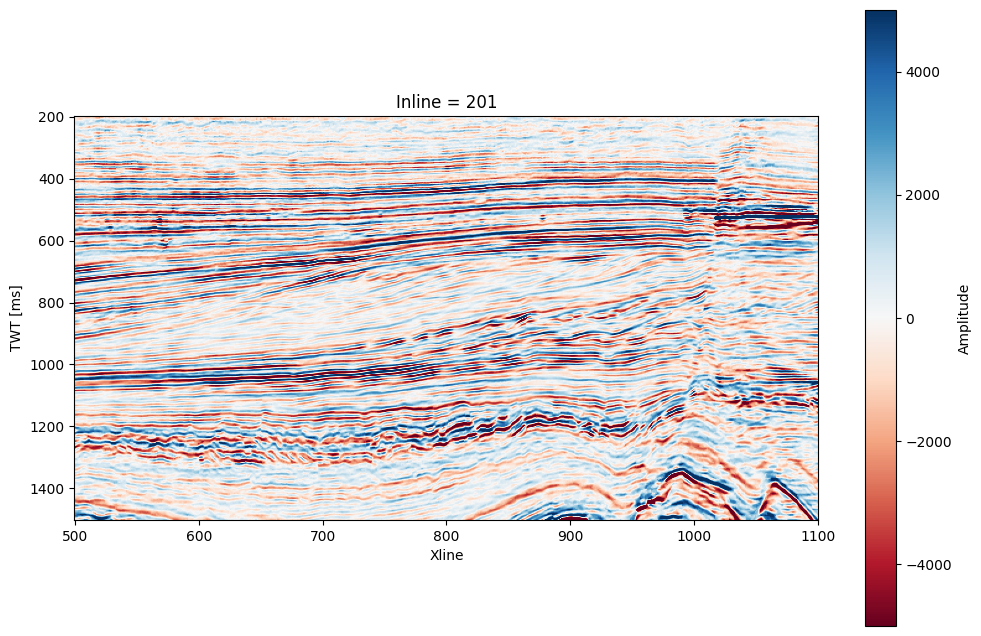

In [212]:
# plot Inline

# inline index
il_id = 1
fig, ax = plt.subplots(figsize=(12,8)) # create figure
sim = ax.imshow(seismic_data[il_id,:,:].T, cmap="RdBu", vmin=-5000, vmax=5000)
# or colormap option cmap="gray_r"
fig.colorbar(sim, label="Amplitude")

plt.xticks(xl_pos, xl_lab)

plt.yticks(twt_pos, twt_lab)

ax.set_xlabel("Xline") 
ax.set_ylabel("TWT [ms]") 
ax.set_title("Inline = " + str(inlines[il_id]))

---------------
### 2D Seismic Images and Labels Input

In [201]:
import os
from os.path import isfile, join
from os import walk
import time
import cv2
import math

In [202]:
def load_pathnames_filenames(path): # read and store all file names in order
    for (_, dirnames, _) in walk(path):
        print("dirnames", dirnames)
        break

    label_path = join(path, dirnames[0])
    seismics_path = join(path, dirnames[1])

    for (_, _, filenames) in walk(label_path):
        labels = sorted(filenames)
    for (_, _, filenames) in walk(seismics_path):
        seismics = sorted(filenames)

    print("number of images in two folder: ",len(labels),len(seismics))
    print("label_path: ", label_path)
    print("seismics_path: ", seismics_path)

    print(labels[:10])
    print(seismics[:10])

    return label_path, seismics_path, labels, seismics

In [203]:
img_path = 'seismic_images/images_IL_XL_labels'
label_path, seismics_path, labels, seismics = load_pathnames_filenames(img_path)

dirnames ['labels', 'seismic']
number of images in two folder:  63 63
label_path:  seismic_images/images_IL_XL_labels\labels
seismics_path:  seismic_images/images_IL_XL_labels\seismic
['IL2800_fault.png', 'IL2900_fault.png', 'IL3000_fault.png', 'IL3100_fault.png', 'IL3200_fault.png', 'IL3300_fault.png', 'IL3400_fault.png', 'IL3500_fault.png', 'IL3600_fault.png', 'IL3700_fault.png']
['IL2800.png', 'IL2900.png', 'IL3000.png', 'IL3100.png', 'IL3200.png', 'IL3300.png', 'IL3400.png', 'IL3500.png', 'IL3600.png', 'IL3700.png']


In [283]:
img = cv2.imread(join(seismics_path,seismics[10]))
mask = cv2.imread(join(label_path,labels[10]))
print(img.shape)
print(mask.shape)

(972, 1421, 3)
(972, 1421, 3)


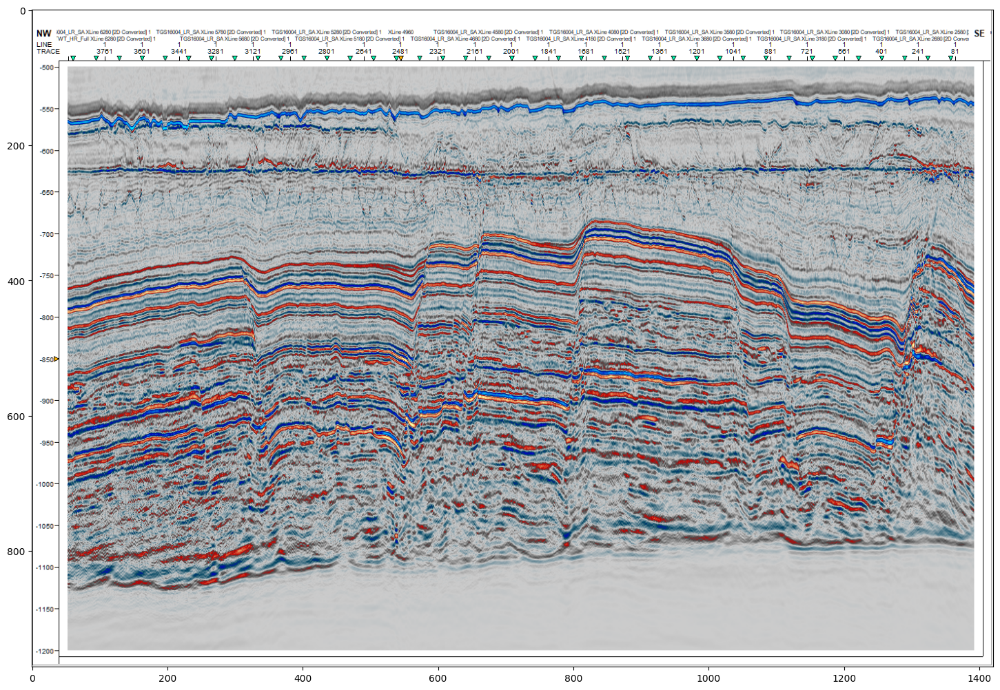

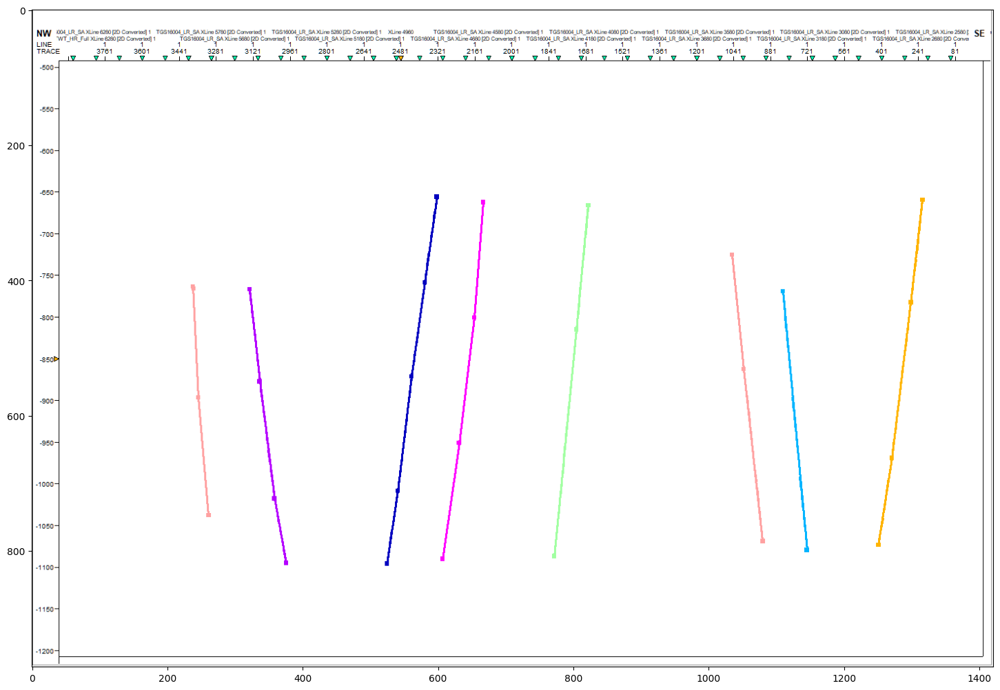

In [324]:
plt.figure(figsize=(18,18))
plt.imshow(img)
plt.show()
plt.figure(figsize=(18,18))
plt.imshow(mask)
plt.show()

### Cropping off the axis of images

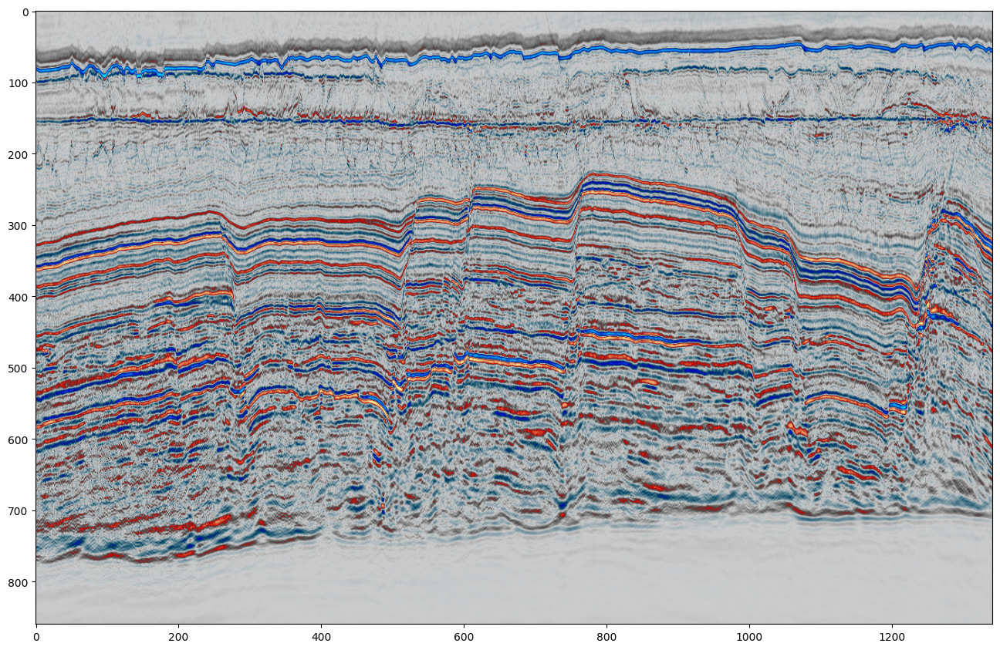

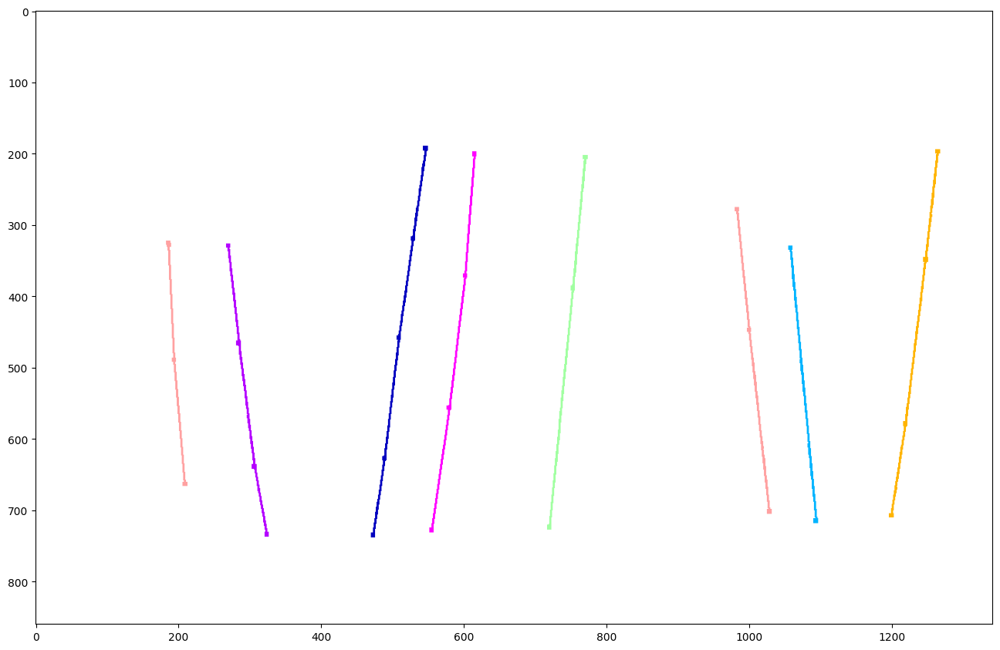

In [325]:
plt.figure(figsize=(18,18))
plt.imshow(img[84:-28,52:-28,:]) # Height and width of Region of Interest (y1:y2, x1:x2, channels)
plt.show()
plt.figure(figsize=(18,18))
plt.imshow(mask[84:-28,52:-28,:]) # Height and width of Region of Interest (y1:y2, x1:x2, channels)
plt.show()

In [298]:
mask1 = mask[84:-28,52:-28,:]
print(mask1.shape)
maskgray = cv2.cvtColor(mask1, cv2.COLOR_BGR2GRAY)
print(maskgray.shape)
print(maskgray.max(), maskgray.min())

(860, 1341, 3)
(860, 1341)
255 57


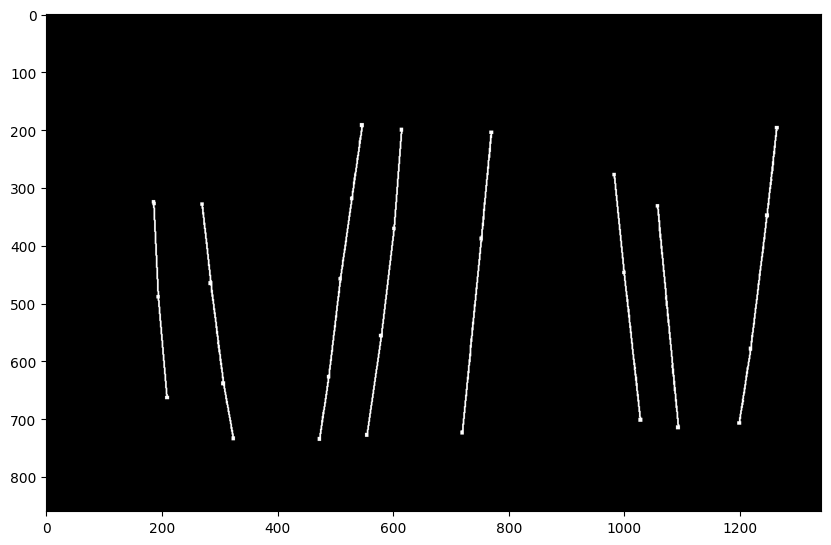

In [321]:
plt.figure(figsize=(10,10))
plt.imshow(maskgray<255,cmap='gray')
plt.show()

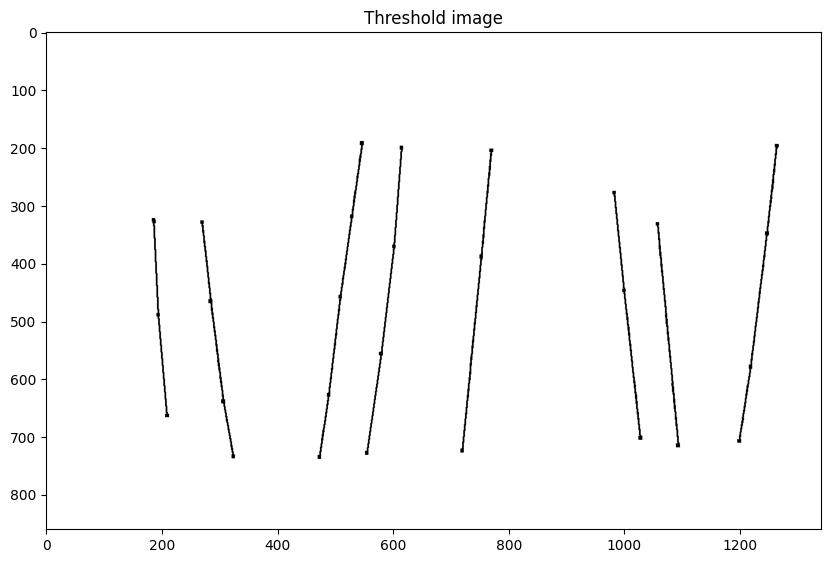

In [330]:
_, binary_image = cv2.threshold(maskgray,254,255, cv2.THRESH_BINARY) 

plt.figure(figsize=(10,10))
plt.imshow(binary_image, cmap='gray', vmin=0, vmax=255)
plt.title('Threshold image')
plt.show()

### Concatenate 2D seismic lines

### Concatenate all the labelled faults

In [ ]:
t_start = time.time()
faults = np.zeros((1803,1537,3174), dtype=np.bool)

for i in range(len(labels)):
    mask = cv2.imread(join(label_path,labels[i]))
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY) # grayscale is good enough for one class, rather than 3 channels
    mask = mask[84:-28,52:-28,:] # remove axis boarders
    mask = cv2.resize(mask,(3174,1537)) # resize them into seismic volume shape.
    mask = mask<255                   # make it binary
    faults[i] = mask
print("read images in {} sec".format(time.time()-t_start))   

In [ ]:
print(faults.shape)

In [ ]:
# np.save("faults.npy",faults)

# or

# np.save("faulttrain.npy",fault[:900])
# np.save("faultval.npy",fault[900:1100])
# np.save("faulttest.npy",fault[1100:])